In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import folium
from sklearn.cluster import DBSCAN

In [5]:
df = pd.read_csv(r"C:\Users\Yuvaraj J\OneDrive\Documents\Cognify Intern\Dataset .csv")

In [6]:
type(df)

pandas.core.frame.DataFrame

In [7]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [8]:
df.head(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591


In [9]:
df.tail(2)

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901
9550,5927402,Walter's Coffee Roastery,208,��stanbul,"Cafea��a Mahallesi, Bademalt۱ Sokak, No 21/B, ...",Moda,"Moda, ��stanbul",29.026016,40.984776,Cafe,...,Turkish Lira(TL),No,No,No,No,2,4.0,Green,Very Good,591


In [10]:
df.shape

(9551, 21)

In [11]:
df.size

200571

In [12]:
df.dtypes

Restaurant ID             int64
Restaurant Name          object
Country Code              int64
City                     object
Address                  object
Locality                 object
Locality Verbose         object
Longitude               float64
Latitude                float64
Cuisines                 object
Average Cost for two      int64
Currency                 object
Has Table booking        object
Has Online delivery      object
Is delivering now        object
Switch to order menu     object
Price range               int64
Aggregate rating        float64
Rating color             object
Rating text              object
Votes                     int64
dtype: object

<hr>

# Data Preprocessing 

## Deduplication

In [13]:
df.duplicated().sum()

0

 * There is no duplicates in the data.

## Checking missing values

In [14]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

 * There is no missing values.

In [15]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

<hr>

# LEVEL 1

## Task 1 : Top Cuisines

### * Determine the top three most common cuisines in the dataset. 

In [16]:
# The total cuisines in the data set

df['Cuisines']

0             French, Japanese, Desserts
1                               Japanese
2       Seafood, Asian, Filipino, Indian
3                        Japanese, Sushi
4                       Japanese, Korean
                      ...               
9546                             Turkish
9547     World Cuisine, Patisserie, Cafe
9548              Italian, World Cuisine
9549                     Restaurant Cafe
9550                                Cafe
Name: Cuisines, Length: 9551, dtype: object

In [17]:
# df['Cuisines'] - column cuisines has various cuisines
# .str.split(', ') - the cuisines are stored in a single string, this splits each cuisines into sub stbstrings
# .explode() - converts each element in the list into its own row
# .value_counts() - used to count the unique values, the highest comes first
# cuisines_count - stores the cuisines in ascending order as the value_counts count the unique values 

cuisines_count = df['Cuisines'].str.split(', ').explode('Cuisines').value_counts()
print(cuisines_count)

Cuisines
North Indian      3960
Chinese           2735
Fast Food         1986
Mughlai            995
Italian            764
                  ... 
Fish and Chips       1
Malwani              1
Cuisine Varies       1
Soul Food            1
B�_rek               1
Name: count, Length: 145, dtype: int64


In [18]:
# cuisines_count.head(3) - head(3) shows the 1st three rows in the cuisines_count
# top_cuisines - stores the 1st three rows which is the top three cuisines


top_cuisines = cuisines_count.head(3)
print(top_cuisines)

Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Name: count, dtype: int64


#### The top three most common cuisines are
| Cuisines | Count |
|----------|---------------|
| North Indian | 3960 |
| Chinese | 2735 | 
| Fast Food | 1986 |



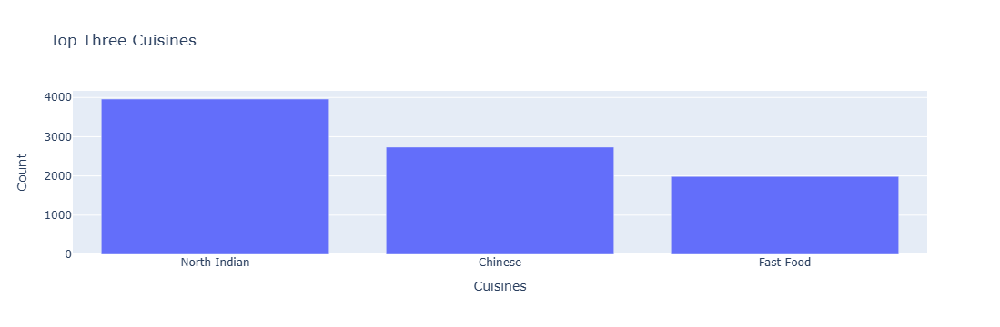

In [19]:
# to show the top 3 cuisines in bar graph, plotly is used


cuisines = px.bar(x = top_cuisines.index, y = top_cuisines.values,
                  labels = {'x' : 'Cuisines', 'y' : 'Count'},
                  title = 'Top Three Cuisines')
cuisines.show()

### * Calculate the percentage of restaurants that serve each of the top cuisines.

In [20]:
# len(df) shows the length of data so the total number of restaurants can be calculated
# round() is used to round off the values

total_restaurants = len(df)
print(total_restaurants)

9551


In [21]:
# percentage is calculated by dividing the count of the top three cuisines by the total number of restaurants, then multiplying by 100.
# round() is used to round off the values

percentage = (cuisines_count.head(3)/total_restaurants)*100
print(round(percentage,2))

Cuisines
North Indian    41.46
Chinese         28.64
Fast Food       20.79
Name: count, dtype: float64


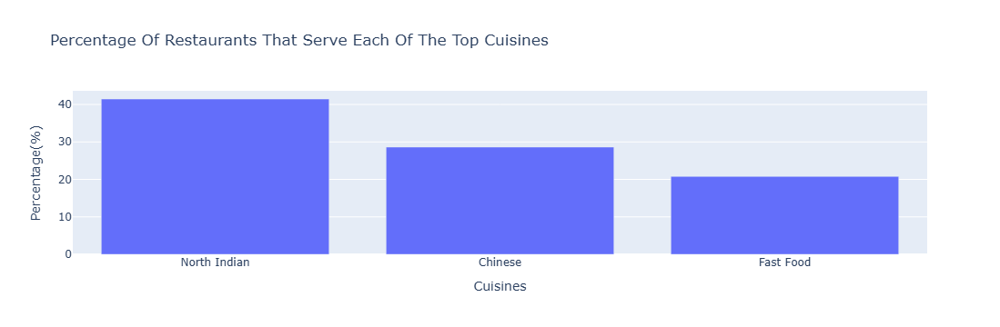

In [22]:
# to show the percentage of restaurants that serve each of the top cuisines in bar graph, plotly is used


per = px.bar(x = percentage.index, y = percentage.values,
            labels = {'x' : 'Cuisines', 'y' : 'Percentage(%)'},
            title = 'Percentage Of Restaurants That Serve Each Of The Top Cuisines')
per.show()

#### The percentage of restaurants that serve each of the top cuisines are

| Cuisines | Restaurants % |
|----------|---------------|
| North Indian | 41.46 |
| Chinese | 28.64 | | Fast Foodo| 20.79 ||3434

<hr>

## Task 2 : City Analysis

### * Identify the city with the highest number of restaurants in the dataset.

In [23]:
# .str.upper() - to check whether the upper case and lower case letters are mixed in the data set
# df['City'].value_counts() - to find repeated values(ie) how much time the city name is repeated


df['City'].str.upper().value_counts().head(1)

City
NEW DELHI    5473
Name: count, dtype: int64

In [24]:
city = df['City'].value_counts().head(1)
print(city)

City
New Delhi    5473
Name: count, dtype: int64


#### The city with the highest number of restaurants is ___New Delhi___ with ___5473___ restaurants.


### * Calculate the average rating for restaurants in each city.

In [25]:
# groupby() is used to group data based on columns here it is grouped by city 
# (i.e) the repeated city is taken as one and the averge rating for restaurants in each city is calculaed
# the average of the rating is calculated using .mean()


avr_ratings = df.groupby('City')['Aggregate rating'].mean()
print (avr_ratings)

City
Abu Dhabi          4.300000
Agra               3.965000
Ahmedabad          4.161905
Albany             3.555000
Allahabad          3.395000
                     ...   
Weirton            3.900000
Wellington City    4.250000
Winchester Bay     3.200000
Yorkton            3.300000
��stanbul          4.292857
Name: Aggregate rating, Length: 141, dtype: float64


#### The average rating for restaurants in each city is calculated.

### * Determine the city with the highest  average rating.

In [26]:
# .idxmax() is used to identify which row has the highest value, in this specific city is mentioned
# .max() is used to identify the maximum value


high_rating_city= avr_ratings.idxmax()
highest_rating = avr_ratings.max()
print(high_rating_city,',',highest_rating)

Inner City , 4.9


#### The city with the highest average rating is ___Inner City___ with ___4.9/5___.


<hr>

## Task 3 : Price Range Distribution

### * Create a histogram or bar chart to visualize the distribution of price ranges among the restaurants.

In [27]:
df ['Price range']

0       3
1       3
2       4
3       4
4       4
       ..
9546    3
9547    3
9548    4
9549    4
9550    2
Name: Price range, Length: 9551, dtype: int64

In [28]:
 #df[df['Price range'] == 4] #can check using this

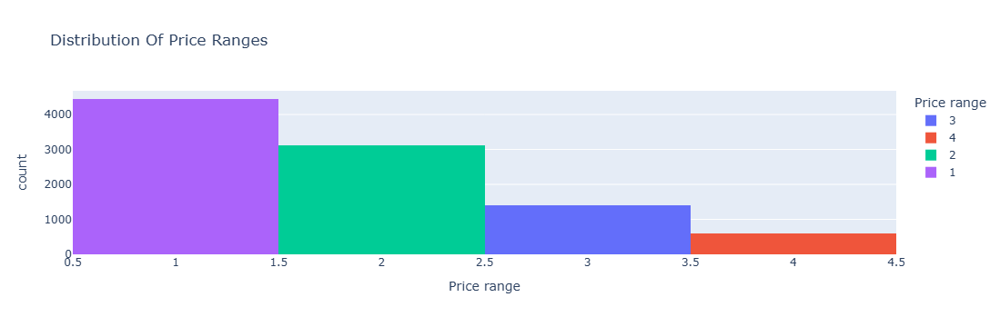

In [29]:
# plotly(histogram) is used to visualize the distribution of price ranges among the restaurants
# plotly.express as px

price_ranges = px.histogram(df, x = 'Price range',
                            color = 'Price range',
                            title = 'Distribution Of Price Ranges')

price_ranges.show()


#### The ___visual representation___ of ___distribution of price ranges among the restaurants___.

### * Calculate the percentage of restaurants  in each price range category.

In [30]:
# .value_counts() used to count the price range
# len(df) length of the df
# percentage is calculaetd the formula 
# pd.merge is used to merge the range_count and percentage_range
# round() is used to round off the values


range_count = df['Price range'].value_counts()
total_restaurants = len(df)
percentage_range = (range_count/total_restaurants)*100
print(pd.merge(range_count,round(percentage_range,2),on='Price range'))

             count_x  count_y
Price range                  
1               4444    46.53
2               3113    32.59
3               1408    14.74
4                586     6.14


#### The percentage of restaurants in each price range category.
|Range | Count | Percentage(%) |
|------|-------|---------------|
| 1 | 4444 | 46.53 |
| 2 | 3113 | 32.59 |
| 3 | 1408 | 14.74 |
| 4 | 586 | 6.14 |.14

<hr>

## Task 4 : Online Delivery

### * Determine the percentage of restaurants that offer online delivery.

In [31]:
# shows the counts yes and no

df['Has Online delivery'].value_counts()

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

In [32]:
# % restaurants that offer online delivery
# df['Has Online delivery'].value_counts().get('Yes') gets the (Yes) rows alone
# percentage is calculated using formula 
# round() is used to round off the values




online_delivery = df['Has Online delivery'].value_counts().get('Yes')
total_restaurants = len(df)
percentage_od = (online_delivery/total_restaurants)*100
print(round(percentage_od,2),"%")

25.66 %


#### The percentage of restaurants that offer online delivery is ___25.66%___.

In [33]:
# % restaurants that doesn't offer online delivery
# df['Has Online delivery'].value_counts().get('No') gets the (No) rows alone
# percentage is calculated using formula 
# round() is used to round off the values




no_online_delivery = df['Has Online delivery'].value_counts().get('No')
total_restaurants = len(df)
percentage_nod = (no_online_delivery/total_restaurants)*100
print(round(percentage_nod,2),"%")

# or

noonline_delivery = round((100 - percentage_od),2)
print(noonline_delivery,"%")

74.34 %
74.34 %


#### The percentage of restaurants that doesn't offer online delivery is ___74.34%___.

* The percentage of restaurants that offer online delivery is 25.66%.
* The percentage of restaurants that doesn't offer online delivery is 74.34%.

### * Compare the average rating of restaurants with and without online delivery.

In [34]:
#df[df['Has Online delivery']=='Yes']['Aggregate rating'].mean() gets the rating for has online delivery - Yes
# .mean() calculates the average of has online delivery
# same for no
# round() is used to round off the values

avg_rating_yes = df[df['Has Online delivery']=='Yes']['Aggregate rating'].mean()
print(f"The average rating of restaurants that offers online delivery {round(avg_rating_yes,2)}")

print()

avg_rating_no = df[df['Has Online delivery']=='No']['Aggregate rating'].mean()
print(f"The average rating of restaurants that offers online delivery {round(avg_rating_no,2)}")


The average rating of restaurants that offers online delivery 3.25

The average rating of restaurants that offers online delivery 2.47


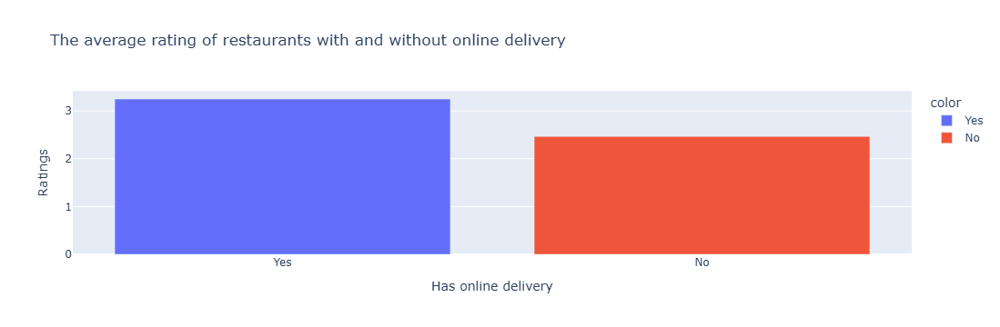

In [35]:
# plotly is used to plot the average rating with and without online delivery


avg_rating = np.array([avg_rating_yes,avg_rating_no])
labels = ['Yes','No']
rating_od = px.bar(x = labels,y = avg_rating,
                   title = 'The average rating of restaurants with and without online delivery',
                   labels = {'x': 'Has online delivery','y':'Ratings'},
                   color = labels)
rating_od.show()

#### The average rating of restaurants with and without online delivery is compared using bar plot.

<hr>

# Level 2

## Task 1 : Restaurant Ratings

### * Analyze the distribution of aggregate ratings and determine the most common rating range.

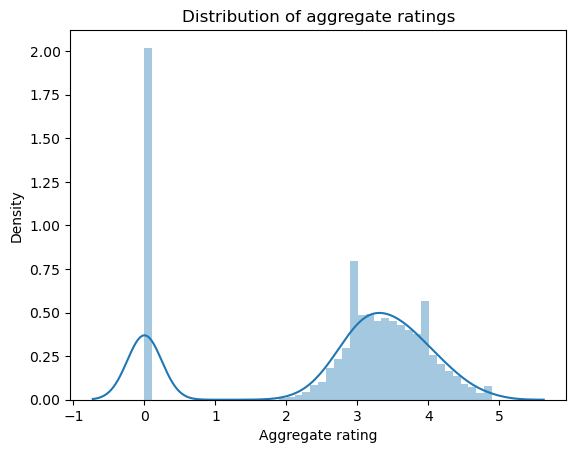

Aggregate rating
3-4    4388
0-1    2148
2-3    1891
4-5    1114
1-2      10
Name: count, dtype: int64


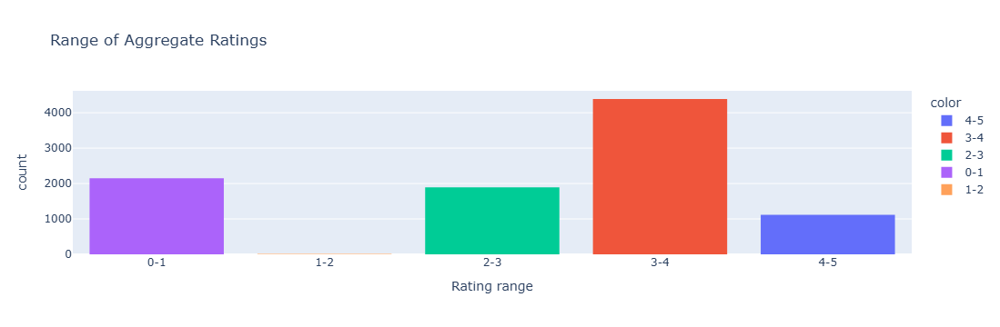

In [36]:
# bins - specifies the rating ranges
# labels - the textual representation of bins (ex: 0-1,1-2)
# pd.cut - segment and sort the df['Aggregate rating'] values into the specified bins
# bins=bins - tells pandas to divide the data into the bins specified earlier ([0, 1, 2, 3, 4, 5])
# labels=label - assigns the textual labels (['0-1', '1-2', '2-3', '3-4', '4-5'])
# include_lowest=True - ensures that the lowest value (e.g., 0) is included in the first bin (0-1).
# seaborn for distribution plot
# plotly for range of aggregate ratings
# filterwarnings removes the errors

from warnings import filterwarnings
filterwarnings ('ignore') 

sns.distplot(df['Aggregate rating'])
plt.title('Distribution of aggregate ratings')
plt.show()

bins = [0, 1, 2, 3, 4, 5]  # Example: ratings from 0 to 5
labels = ['0-1', '1-2', '2-3', '3-4', '4-5']
rating_range = pd.cut(df['Aggregate rating'], bins=bins, labels=labels, include_lowest=True)
print(rating_range.value_counts())


# plotly is used for visual representation
# histogram is used to analyze the disrtibution of aggregate ratings


range = px.histogram(x=rating_range,
                    nbins=5,
                    labels={'x': 'Rating range', 'y': 'Count'},
                    title = 'Range of Aggregate Ratings',
                    category_orders ={'x': ['0-1', '1-2', '2-3', '3-4', '4-5']},
                    color = rating_range )
range.show()

#### The distribution of aggregate ratings
| Rating | Count |
|--------|-------|
| 0-1 | 2148 |
| 1-2 | 10 |
| 2-3 | 1891 |
| ___3-4___ | ___4388___ |
| 4-5 | 1114 |

#### The most common rating range is ___3-4___ and the count - ___4388___.

### * Calculate the average number of votes received by restaurants.

In [37]:
# .mean() is used to calculate the average of the votes
# round() is used to round off the values


votes = df['Votes'].mean()
print(round(votes,3))

156.91


#### The average number of votes received by restaurants - ___156.91___

<hr>

## Task 2 : Cuisine Combination

### * Identify the most common combinations of cuisines in the data set.

In [38]:
df['Cuisines']

0             French, Japanese, Desserts
1                               Japanese
2       Seafood, Asian, Filipino, Indian
3                        Japanese, Sushi
4                       Japanese, Korean
                      ...               
9546                             Turkish
9547     World Cuisine, Patisserie, Cafe
9548              Italian, World Cuisine
9549                     Restaurant Cafe
9550                                Cafe
Name: Cuisines, Length: 9551, dtype: object

In [39]:
# df['Cuisines'].value_counts() - count the cuisines
# combinations.index.str.contains(',') - filters outs rows that contains ',' 
# combinations[combinations.index.str.contains(',')] - retains cuisines has a comma, which corresponds to combinations of cuisines


combinations = df['Cuisines'].value_counts()
commom_combinations = combinations[combinations.index.str.contains(',')]
print (commom_combinations.head(5))

Cuisines
North Indian, Chinese             511
North Indian, Mughlai             334
North Indian, Mughlai, Chinese    197
Bakery, Desserts                  170
Pizza, Fast Food                  131
Name: count, dtype: int64


#### The most common combinations of cuisines :
| Combinations | Count |
|--------------|-------|
| North Indian, Chinese | 511 |
| North Indian, Mughlai  | 334 |
| North Indian, Mughlai, Chinese | 197 |
| Bakery, Desserts | 170 |
| Pizza, Fast Food | 131 |

### * Determine if certain cuisine combinations tend to have higher ratings

In [40]:
# df.groupby('Cuisines')['Aggregate rating'].mean()- grouped cuisines with ratings
# comb_ratings.max() - calculates the maximum value of combination ratings
# comb_ratings[comb_ratings==max_rating] - where the comb_ratings = max_rating is stored
# maximum rating = 4.9


comb_ratings = df.groupby('Cuisines')['Aggregate rating'].mean()
max_rating = comb_ratings.max()
comb_high_ratings = comb_ratings[comb_ratings==max_rating]
print("Maximum Rating =",max_rating )
print(comb_high_ratings)

Maximum Rating = 4.9
Cuisines
American, BBQ, Sandwich            4.9
American, Burger, Grill            4.9
American, Caribbean, Seafood       4.9
American, Coffee and Tea           4.9
American, Sandwich, Tea            4.9
BBQ, Breakfast, Southern           4.9
Burger, Bar Food, Steak            4.9
Continental, Indian                4.9
European, Asian, Indian            4.9
European, Contemporary             4.9
European, German                   4.9
Hawaiian, Seafood                  4.9
Italian, Bakery, Continental       4.9
Italian, Deli                      4.9
Mexican, American, Healthy Food    4.9
Mughlai, Lucknowi                  4.9
Sunda, Indonesian                  4.9
World Cuisine                      4.9
Name: Aggregate rating, dtype: float64


#### Certain cuisine combinations tend to have higher ratings are :
| Cuisines Combination | Ratings |
|----------------------|---------|
|American, BBQ, Sandwich| 4.9||American, Burger, Grill|4.9 
|American, Caribbean, Seafood | 4.9|
|American, Coffee and Tea|4.9|
|American, Sandwich, Tea|4.9|
|BBQ, Breakfast, Southern|4.9
|Burger, Bar Food, Steak|4.9|
|Continental, Indian|4.9|
|European, Asian, Indian|4.9|
|European, Contemporary|4.9|
|European, German|4.9|
|Hawaiian, Seafood|4.9|
|Italian, Bakery, Continental|4.9|
|Italian, Deli|4.9|
|Mexican, American, Healthy Food|4.9|
|Mughlai, Lucknowi|4.9|
|Sunda, Indonesian|4.9|
|World Cuisine|4.9||              4.9

<hr>

## Task 3 : Geographic Analysis

### * Plot the locations of retaurants on map using longitude and latitude coordinates.

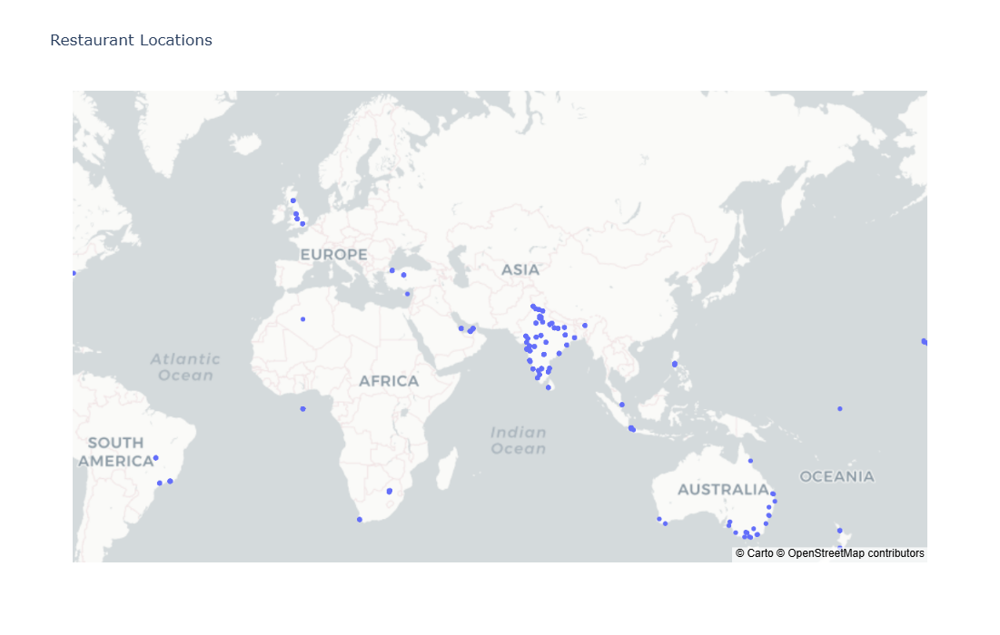

In [41]:
# plotly is used for plotting the locations
map = px.scatter_mapbox(df, lat="Latitude", lon="Longitude",
                        hover_name="Restaurant Name",
                        hover_data=["City","Restaurant Name","Cuisines"],
                        zoom=1.25,
                        height=700,
                        title="Restaurant Locations")

map.update_layout(mapbox_style="carto-positron")
map.show()

### * Identify any patterns or clusters of restaurants  in specific areas.

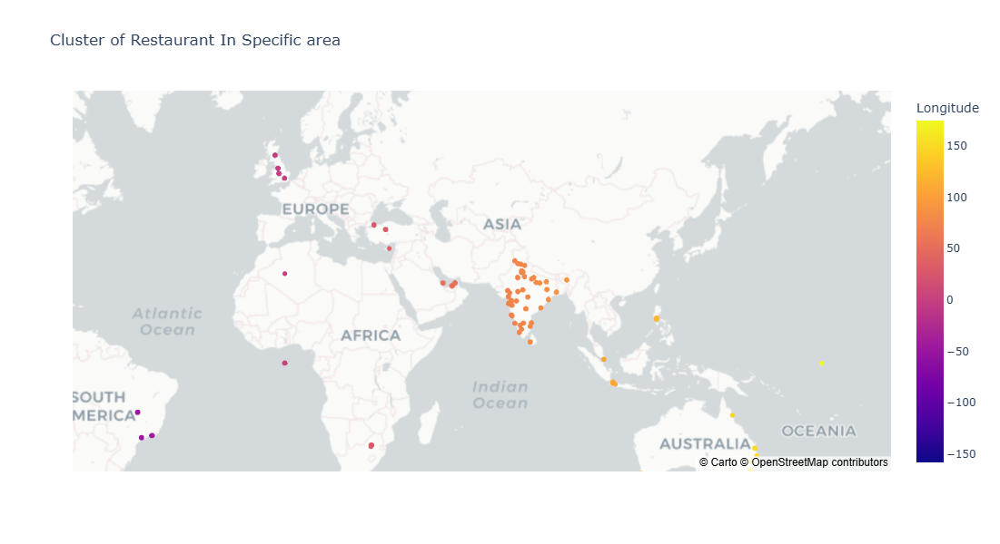

In [42]:
map_cluster = px.scatter_mapbox(df, 
                                lat="Latitude", 
                                lon="Longitude",
                                color="Longitude",
                                hover_name="Restaurant Name",
                                hover_data=["City","Restaurant Name","Cuisines"],
                                zoom=1.25,
                                height=600,
                                title="Cluster of Restaurant In Specific area")
map_cluster.update_layout(mapbox_style="carto-positron")

<hr>

### Task 4 : Restaurant Chains

#### * Identify if there are any restaurants chains present in the dataset.

In [43]:
# the restaurants name count is taken
# the restaurant name more than once is the restaurant chains


restaurant_counts = df['Restaurant Name'].value_counts()
restaurant_chain = restaurant_counts[restaurant_counts > 1]
print(restaurant_chain)

Restaurant Name
Cafe Coffee Day       83
Domino's Pizza        79
Subway                63
Green Chick Chop      51
McDonald's            48
                      ..
Town Hall              2
Halki Aanch            2
Snack Junction         2
Delhi Biryani Hut      2
Beliram Degchiwala     2
Name: count, Length: 734, dtype: int64


In [44]:
# .isin checks whether the 'Restaurant Name' are in the chain pf restaurants
restaurant_chains = restaurant_counts[restaurant_counts > 1].index
chain_restaurants = df[df['Restaurant Name'].isin(restaurant_chains)]
print("The Restaurant Chains")
chain_restaurants

The Restaurant Chains


,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
5,18189371,Din Tai Fung,162,Mandaluyong City,"Ground Floor, Mega Fashion Hall, SM Megamall, ...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056314,14.583764,Chinese,...,Botswana Pula(P),No,No,No,No,3,4.4,Green,Very Good,336
10,6309903,Silantro Fil-Mex,162,Pasig City,"75 East Capitol Drive, Kapitolyo, Pasig City",Kapitolyo,"Kapitolyo, Pasig City",121.057916,14.567689,"Filipino, Mexican",...,Botswana Pula(P),No,No,No,No,3,4.9,Dark Green,Excellent,1070
12,6318433,Silantro Fil-Mex,162,Quezon City,"Second Floor, UP Town Center, Katipunan Avenue...","UP Town Center, Diliman, Quezon City","UP Town Center, Diliman, Quezon City, Quezon City",121.075419,14.649503,"Filipino, Mexican",...,Botswana Pula(P),No,No,No,No,3,4.8,Dark Green,Excellent,294
35,6601589,Coco Bambu,30,Bras�_lia,"Bras�_lia Shopping - Piso 2, SCN 5, Bloco A, A...","Bras�_lia Shopping, Asa Norte","Bras�_lia Shopping, Asa Norte, Bras�_lia",-47.889000,-15.786500,International,...,Brazilian Real(R$),No,No,No,No,4,4.2,Green,Very Good,17
39,6600427,Coco Bambu,30,Bras�_lia,"SCES, Trecho 2, Conjunto 13/36, Setor de Clube...",Setor De Clubes Esportivos Sul,"Setor De Clubes Esportivos Sul, Bras�_lia",-47.868500,-15.819000,International,...,Brazilian Real(R$),No,No,No,No,4,4.9,Dark Green,Excellent,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9517,6001980,Timboo Cafe,208,Ankara,"Armada AVM, Kat -1, Eski��ehir Yolu, No 6, Yen...","Armada AVM, S�_���_t�_z�_, Yenimahalle","Armada AVM, S�_���_t�_z�_, Yenimahalle, Ankara",32.809247,39.913206,Cafe,...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,134
9528,6003668,Timboo Cafe,208,Ankara,"Kentpark AVM, Kat -1, Mustafa Kemal Mahallesi,...","Kentpark AVM, ��niversiteler, �ankaya","Kentpark AVM, ��niversiteler, �ankaya, Ankara",32.776255,39.908957,Cafe,...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,79
9534,6004089,D�_vero��lu,208,Ankara,"Maltepe Mahallesi, Gen�_lik Caddesi, No 28, �a...",Maltepe,"Maltepe, Ankara",32.842742,39.922536,"Kebab, Desserts, Turkish Pizza",...,Turkish Lira(TL),No,No,No,No,3,4.4,Green,Very Good,131
9535,6000921,D�_vero��lu,208,Ankara,"��mitk�_y Mahallesi, 2432. Cadde (8. Cadde), N...",��mitk�_y,"��mitk�_y, Ankara",32.701775,39.891564,"Kebab, Desserts, Turkish Pizza",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,152


#### * Analyze the ratings and popularity of  different restaurant chains.


In [45]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [46]:
# average_ratings - averaage rating of each chain of restaurants
# average_votes -  average of votes of each chain of restaurants
# then the popularity considered with these parameters


average_ratings = chain_restaurants.groupby('Restaurant Name')['Aggregate rating'].mean()
average_votes = chain_restaurants.groupby('Restaurant Name')['Votes'].mean()
chain_analysis = pd.DataFrame({
    'Average Rating': average_ratings,
    'Votes' : average_votes,
    'Number of Locations': restaurant_chain
}).sort_values(by='Votes', ascending=False)


print("Ratings and Popularity of Different Restaurant Chain")
print(chain_analysis)

Ratings and Popularity of Different Restaurant Chain
                           Average Rating        Votes  Number of Locations
Restaurant Name                                                            
Truffles                         3.950000  4841.000000                    2
Joey's Pizza                     4.250000  3903.500000                    2
AB's - Absolute Barbecues        4.825000  3350.000000                    4
Big Chill                        4.475000  2713.250000                    4
Big Yellow Door                  4.266667  2503.666667                    3
...                                   ...          ...                  ...
Whatslife.in                     0.000000     0.000000                    2
Bikaner Misthan Bhandar          0.000000     0.000000                    2
Chinese Fast Food                0.000000     0.000000                    2
The Big Scoop                    0.000000     0.000000                    2
Dev Food                         0.

In [47]:
print("Top 10  Restaurant Chains With The High Population Based on Votes")
print(chain_analysis.head(10))

Top 10  Restaurant Chains With The High Population Based on Votes
                           Average Rating        Votes  Number of Locations
Restaurant Name                                                            
Truffles                         3.950000  4841.000000                    2
Joey's Pizza                     4.250000  3903.500000                    2
AB's - Absolute Barbecues        4.825000  3350.000000                    4
Big Chill                        4.475000  2713.250000                    4
Big Yellow Door                  4.266667  2503.666667                    3
Out Of The Box                   3.850000  2450.000000                    2
Saravana Bhavan                  4.133333  2412.666667                    3
Olive Bistro                     4.150000  1854.000000                    2
Talaga Sampireun                 4.900000  1838.000000                    3
SpiceKlub                        4.300000  1825.500000                    2


<hr>

# Level 3


## Task 1 : Restaurant Reviews

### * Analyze the text reviews to identify the most common positive and negative keywords

In [48]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [49]:
# to know the different values and their counts in the 'Rating text'

df['Rating text'].value_counts()

Rating text
Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: count, dtype: int64

In [50]:
# positive test reviews 

# rating greater than or equal to 3.5 is stored in positive_rating
# then it is grouped by 'Aggregate rating' (i.e) rating >= 3.5 and their respective 'Rating text' is grouped
# their counts are taken using .size()


positive_rating = df[df['Aggregate rating'] >= 3.5]
positive_rating_text = positive_rating.groupby('Rating text')
positive_rating_text_counts = positive_rating_text.size()
print("The Most Common Positive Keywords")
print(positive_rating_text_counts)

The Most Common Positive Keywords
Rating text
Excellent     301
Good         2100
Very Good    1079
dtype: int64


In [51]:
#negative text reviews 

# rating greater than 0 % less than 2.5 is stored in negative_rating
# then it is grouped by 'Aggregate rating' (i.e) rating >0 & <2.5 and their respective 'Rating text' is grouped
# their counts are taken using .size()


negative_rating = df[(df['Aggregate rating']>0) & (df['Aggregate rating']<2.5)]
negative_rating_text = negative_rating.groupby('Rating text')
negative_rating_text_counts = negative_rating_text.size()
print("The Most Common Negative Keywords")
print(negative_rating_text_counts)

The Most Common Negative Keywords
Rating text
Poor    186
dtype: int64


In [52]:
# neutral text reviews 

# rating greater than equal to 2.5 & less than 3.5 is stored in neutral_rating
# then it is grouped by 'Aggregate rating' (i.e) rating >=2.5 & <3.5 and their respective 'Rating text' is grouped
# their counts are taken using .size()


neutral_rating = df[(df['Aggregate rating'] >=2.5) & (df['Aggregate rating']<3.5)]
neutral_rating_text = neutral_rating.groupby('Rating text')
neutral_rating_text_counts = neutral_rating_text.size()
print(neutral_rating_text_counts)

Rating text
Average    3737
dtype: int64


In [53]:
# not rated

# rating  equal to 0 is stored in neutral_rating
# then it is grouped by 'Aggregate rating' (i.e) rating == 0 and their respective 'Rating text' is grouped
# their counts are taken using .size()


no_rating = df[df['Aggregate rating']==0]
no_rating_text = no_rating.groupby('Rating text')
no_rating_text_count = no_rating_text.size()
print(no_rating_text_count)

Rating text
Not rated    2148
dtype: int64


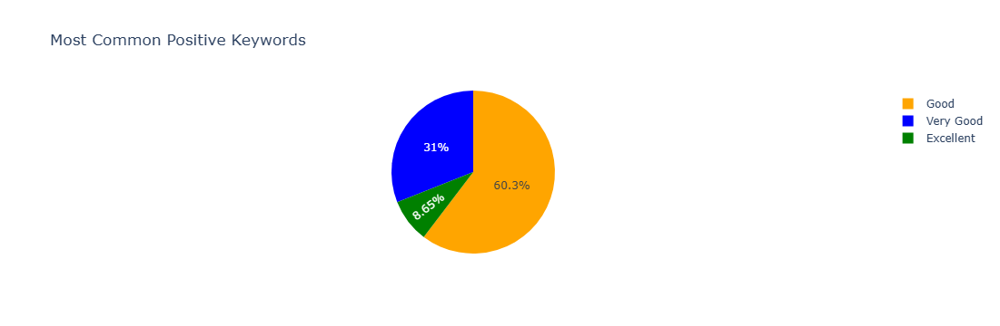

In [54]:
# plotly is used to make the pie chart for # positive test reviews


positive_keywords = px.pie(
    positive_rating_text_counts,
    names=positive_rating_text_counts.index,  
    values=positive_rating_text_counts.values,
    title='Most Common Positive Keywords',
    color=positive_rating_text_counts.index,
    color_discrete_map={"Excellent": "green", "Very Good": "blue", "Good": "orange"}
)
positive_keywords


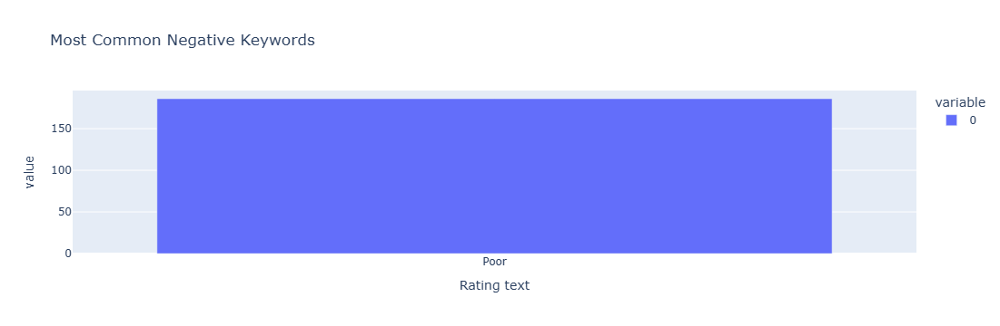

In [56]:
# plotly is used to make a bar graph for #negative text reviews


negative_keywords = px.bar(negative_rating_text_counts,
                    labels={'x': 'Rating text', 'y': 'Count'},
                    title = 'Most Common Negative Keywords')
negative_keywords

#### The most common positive and negative keywords

| Positive Keywords | Negative Keywords |
|----------|--------|
| Good | Poor |
|Very Good  |
|Excellent|

### * Calculate the average length of reviews and explore if there is a relationship between review length and rating.

In [57]:
#  df["Review Length"] stores the length of number of words in each column of "Rating text"
# .mean() finds the average of df["Review Length"]

df["Review Length"] = df["Rating text"].apply(lambda x: len(x.split()))
average_length = df["Review Length"].mean()
print("Average Review Length:", round(average_length,4))


Average Review Length: 1.3379


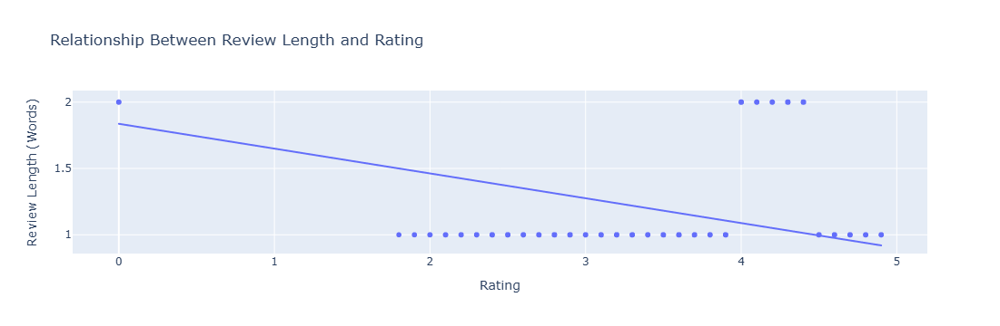

In [58]:
# plotly is used to scatter plot the graph between "Aggregate rating" and Review Length"

# Create a scatter plot
fig = px.scatter(
    df,
    x="Aggregate rating",
    y="Review Length",
    title="Relationship Between Review Length and Rating",
    labels={"Aggregate rating": "Rating", "Review Length": "Review Length (Words)"},
    trendline="ols"
)
fig.show()


In [59]:
# .corr() used to find the correlation between df["Aggregate rating"] and df["Review Length"]

correlation = df["Aggregate rating"].corr(df["Review Length"])
print("Correlation Between Review Length and Rating:", round(correlation,4))

Correlation Between Review Length and Rating: -0.5996


#### The average length of reviews is 1.3379 and correlation between 'Aggregate rating' and 'Review Length' is -0.5996

<hr>

## Task 2 : Votes Analysis

### * Identify the restaurants with the highest and lowest number of votes.

In [60]:
# df['Votes'].max() shows the maximum value in the column and it is stored in highest_vote
# highest_vote_rest filters the df['Votes'] equal to highest_vote
# highest_vote_rest is given as output with respective respective 'Restaurant Name' and 'Votes'


highest_vote = df['Votes'].max()
highest_vote_rest = df[df['Votes'] == highest_vote]
print("Restaurant with the highest votes:")
print(highest_vote_rest[['Restaurant Name', 'Votes']])

Restaurant with the highest votes:
    Restaurant Name  Votes
728            Toit  10934


In [61]:
# df['Votes'].min() shows the minimum value in the column and it is stored in lowest_vote
# lowest_vote_rest filters the df['Votes'] equal to lowest_vote
# lowest_vote_rest is given as output with respective respective 'Restaurant Name' and 'Votes'


lowest_vote = df['Votes'].min()
lowest_vote_rest = df[df['Votes'] == lowest_vote]
print("Restaurants with the lowest votes:")
print(lowest_vote_rest[['Restaurant Name', 'Votes']])

Restaurants with the lowest votes:
                 Restaurant Name  Votes
69              Cantinho da Gula      0
874                The Chaiwalas      0
879           Fusion Food Corner      0
880                Punjabi Rasoi      0
887                Baskin Robbin      0
...                          ...    ...
9044               6 Packs Momos      0
9098                   Cafe' Wow      0
9099  Chef's Basket Pop Up Caf��      0
9103            The Hangout-Deli      0
9111                    Platters      0

[1094 rows x 2 columns]


In [70]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Review Length,Price Range Binned
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,No,No,No,3,4.8,Dark Green,Excellent,314,1,1000+
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,No,No,No,3,4.5,Dark Green,Excellent,591,1,1000+
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,No,No,No,4,4.4,Green,Very Good,270,2,1000+
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,No,No,No,4,4.9,Dark Green,Excellent,365,1,1000+
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,No,No,No,4,4.8,Dark Green,Excellent,229,1,1000+
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,No,No,No,3,4.1,Green,Very Good,788,2,0-200
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,No,No,No,3,4.2,Green,Very Good,1034,2,0-200
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,No,No,No,4,3.7,Yellow,Good,661,1,0-200
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,No,No,No,4,4.0,Green,Very Good,901,2,0-200


### * Analyze if there is a correlation between the number of votes and the rating of a restaurant. 

In [62]:
# .corr() is used to correlation between df['Votes'] and df['Aggregate rating']


corr_votes_rating = df['Votes'].corr(df['Aggregate rating'])
print("The correlation between the number of votes and the rating of a restaurant is" ,round(corr_votes_rating,4))

The correlation between the number of votes and the rating of a restaurant is 0.3137


#### Correlation between the number of votes and the rating of a restaurant

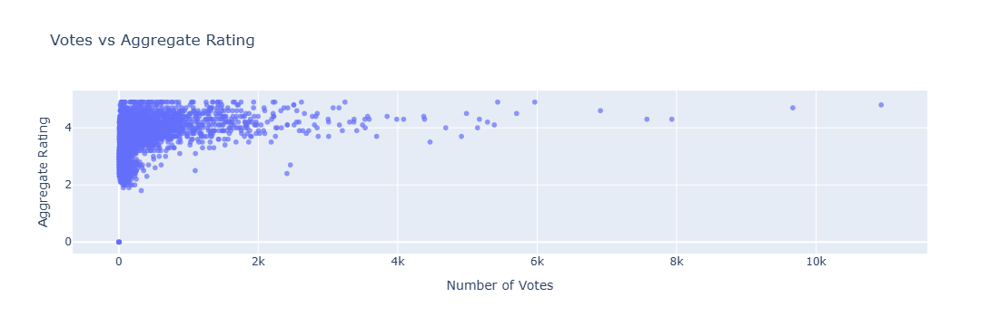

In [63]:
# plotly is used to plot correlation between 'Votes' and  'Aggregate rating'


px.scatter(df,
            x=df["Votes"],
            y=df["Aggregate rating"],
            hover_name = "Restaurant Name",
            title="Votes vs Aggregate Rating",
            labels={"Votes": "Number of Votes", "Aggregate rating": "Aggregate Rating"}, 
            opacity=0.7)

<hr>

## Task 3 : Price Range vs. Online Delivery and Table Booking

### * Analyze if there is a relationship between the price range and the availability of online dalivery and table booking.

In [64]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes', 'Review Length'],
      dtype='object')

In [65]:
df['Has Table booking'].value_counts()

Has Table booking
No     8393
Yes    1158
Name: count, dtype: int64

In [66]:
df['Has Online delivery'].value_counts()

Has Online delivery
No     7100
Yes    2451
Name: count, dtype: int64

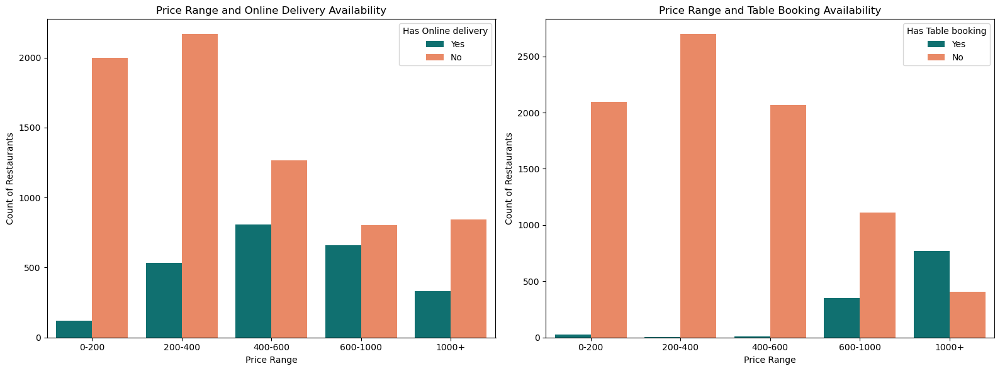

In [67]:
# plots are created using seaborn
# Define custom bins and labels
custom_bins = [0, 200, 400, 600, 1000, 800000]
bin_labels = ['0-200', '200-400', '400-600', '600-1000', '1000+']

# Create a new column 'Price Range Binned' by binning 'Average Cost for two'
df['Price Range Binned'] = pd.cut(df['Average Cost for two'], bins=custom_bins, labels=bin_labels)


# Create two subplots with a size of 10x5 (side by side in the same row)
plt.figure(figsize=(16, 6))

# consistent color palette for Yes/No categories
palette = {'Yes': 'teal', 'No': 'coral'}


# Create the count plot for Price Range vs Online Delivery
plt.subplot(1, 2, 1)
sns.countplot(x='Price Range Binned', hue='Has Online delivery', hue_order=['Yes', 'No'],palette = palette, data=df)
plt.title('Price Range and Online Delivery Availability')
plt.xlabel('Price Range')
plt.ylabel('Count of Restaurants')

# Create the count plot for Price Range vs Table Booking
plt.subplot(1, 2, 2)
sns.countplot(x='Price Range Binned', hue='Has Table booking', hue_order=['Yes', 'No'], palette = palette, data=df)
plt.title('Price Range and Table Booking Availability')
plt.xlabel('Price Range')
plt.ylabel('Count of Restaurants')

# Adjust layout and show both plots
plt.tight_layout()
plt.show()


#### Price Range and Online Delivery Availability
* Online delivery is available across all price ranges, but the number of restaurants offering it is consistently lower than those that don't offer online delivery.
* The `400-600` price range shows the highest availability of online delivery, suggesting that restaurants in this range prioritize convenience.
* The `200-400` and `600-1000` price range has relatively less availability of online delivery compared to the `400-600` range but still shows moderate adoption.
* Restaurants in the `0-200` and `1000+` price ranges have very limited availability of online delivery, likely focusing on in-house dining.

#### Price Range and Table Booking Availability
* Restaurants in the `0-600` price range have limited table booking availability, with a preference for walk-in customers rather than reservations.
* In the `600-1000` price range, there is a moderate availability of table bookings, but a significant number of restaurants still do not offer this option.
* Restaurants in the `1000+` price range show higher table booking availability, indicating a focus on providing exclusive dining experiences for customers willing to spend more.

### * Determine if higher-priced restaurants are more likely to offer other services.


Counts of 'Yes' and 'No' for each service:
Availability            No  Yes
Service                        
Has Online delivery    845  330
Has Table booking      407  768
Is delivering now     1173    2
Switch to order menu  1175    0


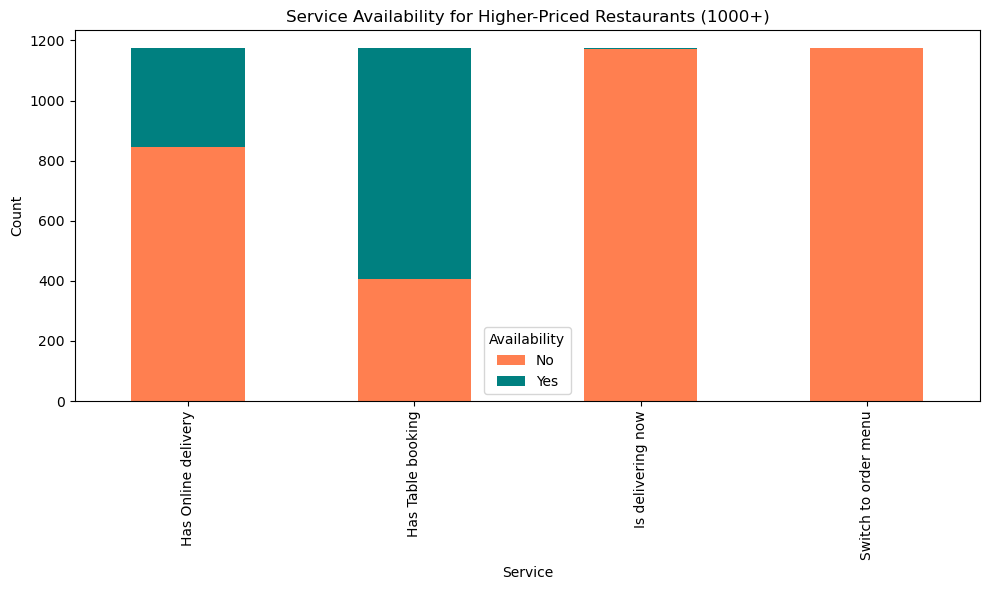

In [68]:
# Select the columns representing the services
services = ['Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu']

# Filter for higher-priced restaurants
higher_price_res = df[df['Price Range Binned'] == '1000+']

# Melt the DataFrame to reshape it for Yes/No count analysis
melted_services = higher_price_res.melt(value_vars=services, 
                                        var_name='Service', 
                                        value_name='Availability')

# Count the Yes/No occurrences for each service
service_counts = melted_services.groupby(['Service', 'Availability']).size().unstack(fill_value=0)

# Print the result
print("Counts of 'Yes' and 'No' for each service:")
print(service_counts)

# Plotting the counts
service_counts.plot(kind='bar', stacked=True, figsize=(10, 6), color=['coral', 'teal'])
plt.title("Service Availability for Higher-Priced Restaurants (1000+)")
plt.xlabel("Service")
plt.ylabel("Count")
plt.legend(title='Availability', labels=['No', 'Yes'])
plt.tight_layout()
plt.show()


* Higher-priced restaurants are `less likely to offer services such as "Is delivering now" and "Switch to order menu."` However, they `tend to offer "Has Table booking" more frequently, with "Has Online delivery" being available to a smaller extent.`

<hr>